Pós-graduação em Ciência de Dados e Machine Learning

Módulo 3 - Data Mining e Machine Learning

Disciplina: Processamento de Linguagem Natural
Turma: A


Dupla
Nome do Integrante: Pedro Henrique Rodrigues Mendes RA: 52000060

Nome do Integrante: Matheus Roberto Silva RA: 52000056


Poste um script em python utilizando o pacote spacy e outros para a leitura de arquivos / textos da publicação científica e a análise e visualização dos dados textuais além de nuvem de palavras e histograma de frequência

In [ ]:
import nltk
nltk.download('punkt')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


True

In [ ]:
# Import WordNetLemmatizer
from nltk.stem import WordNetLemmatizer

# Import Counter
from collections import Counter

import pandas as pd

from matplotlib import pyplot as plt

from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [ ]:
# Importação do texto vindo do .txt
with open('/content/PM-ZKV-1393-IRA.txt', 'r') as file:
    data = file.read().replace('\n', '')

In [ ]:
# Amostra do dado
data

'**** *PMID_31158508 *DP_2019_Oct-Nov *LA1_eng *PL_FranceZika virus infection: an update. Since the ZIKV outbreak in Brazil in 2015, the scientific community has joined  efforts to gather more information on the epidemiology, clinical features and  pathogenicity of the virus. Here, we summarize the most important advances made  recently and discuss promising, innovative approaches to understand and control ZIKV  infection.**** *PMID_31682478 *DP_2020_Feb *LA1_eng *PL_CanadaZika virus: an emerging challenge to public health worldwide. Zika virus (ZIKV) is a mosquito-borne virus that was first isolated from Zika  forest, Uganda, in 1947. Since its inception, major and minor outbreaks have been  documented from several parts of world. Aedes spp. mosquitoes are the primary  vectors of ZIKV, but the virus can also be transmitted through sexual practices,  materno-fetal transmission, and blood transfusion. The clinical presentations of  symptomatic ZIKV infections are similar to dengue and c

In [ ]:

# Tokenização do artigo: tokens
tokens = word_tokenize(data)

# Converter os tokens para minusculo: lower_tokens
lower_tokens = [t.lower() for t in tokens]

# Filtrar apenas palavras alfabeticas: alpha_only
alpha_only = [t for t in lower_tokens if t.isalpha()]

stop_words = ['the','of','and','in','a','for','with','that','to','this','is','were','we','are','on','a','an','or','by']

# Remover as stopswords: no_stops
no_stops = [t for t in alpha_only if t not in stop_words ]

# Instanciar a função WordNetLemmatizer
wordnet_lemmatizer = WordNetLemmatizer()

# Realizar o Lemmatizador dos tokens em uma nova lista
lemmatized = [wordnet_lemmatizer.lemmatize(t) for t in no_stops]

# Criar o Bag-of-words: bow
bow = Counter(lemmatized)

# Print the 10 most common tokens
print(bow.most_common(12))

[('virus', 4497), ('zikv', 3842), ('zika', 3161), ('infection', 2547), ('a', 1707), ('wa', 1583), ('from', 1438), ('cell', 1313), ('study', 1180), ('viral', 927), ('disease', 903), ('dengue', 873)]


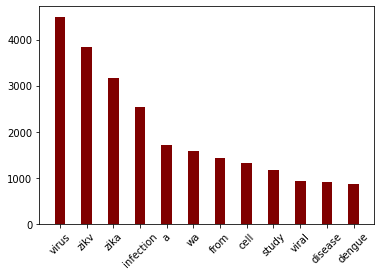

In [ ]:
# Dataframe pandas para melhor aplicar no matplotlib o dicionario criado no bow.most_common
hist_data = pd.DataFrame(bow.most_common(12), columns=['Word','Freq']) 

# Plot do histograma do corpus
plt.bar(hist_data.Word, hist_data.Freq, color ='maroon',
        width = 0.4);
plt.xticks(rotation=45);

In [ ]:
# Adequando os STOPWORDS para o Wordcloud
stopwords = set(STOPWORDS)
stopwords.update(['the','of','and','in','a','for','with','that','to','this','is','were','we','are','on','a','an','or','by'])
 
# gerar uma wordcloud
wordcloud = WordCloud(stopwords=stopwords,
                      background_color="White",
                      width=1600, height=800).generate(data)

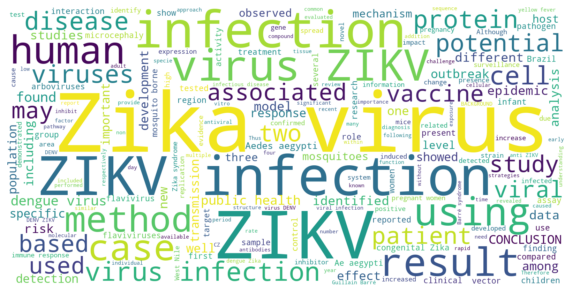

In [ ]:
# Criação do Plot Wordcloud
fig, ax = plt.subplots(figsize=(10,6))
ax.imshow(wordcloud, interpolation='bilinear')
ax.set_axis_off()

In [ ]:
import spacy

In [ ]:
nlp = spacy.load('en')
nlp.max_length = 2200000

In [ ]:
text = nlp(data)

In [ ]:
spacy.displacy.render(text, style='ent', jupyter=True)